# Re-Rendering using Open3D

## Import modules

Install Open3D

In [1]:
# !pip install open3d

Import libraries

In [1]:
import os
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt

## Load demo data

In [2]:
# Data for demo folder contains RGB and Depth image
# and intrinsic camera parameters (Azure Kinect)
DATA_DIR = "./data_demo"
image_filename = os.path.join(DATA_DIR, "image.jpg")
depth_filename = os.path.join(DATA_DIR, "depth.png")
intrinsic_image_filename = os.path.join(DATA_DIR, "image_intrinsic.txt")
intrinsic_depth_filename = os.path.join(DATA_DIR, "depth_intrinsic.txt")

In [3]:
# Import images as numpy arrays
# and intrinsic matrices as 3x3 matrix
# |f_x,   0, c_x,   0|
# |  0, f_y, c_y,   0|
# |  0,   0,   1,   0|
# |  0,   0,   0,   1|
image = o3d.io.read_image(image_filename)
depth = o3d.io.read_image(depth_filename)
intrinsic_image = np.loadtxt(intrinsic_image_filename)
intrinsic_depth = np.loadtxt(intrinsic_depth_filename)

intrinsic_image = np.block([[intrinsic_image, np.zeros((3, 1))],
                            [np.zeros((1, 3)), 1]])
intrinsic_depth = np.block([[intrinsic_depth, np.zeros((3, 1))],
                            [np.zeros((1, 3)), 1]])

Form variables from loaded matrices

In [4]:
def get_focal_from_intrinsic(intrinsic):
    return (intrinsic[0, 0], intrinsic[1, 1])

def get_principal_from_intrinsic(intrinsic):
    return (intrinsic[0, 2], intrinsic[1, 2])

In [5]:
# Image sizes
image_size = np.asarray(image).shape[:2]
depth_size = np.asarray(depth).shape[:2]

# Focal length and Principal point in Screen space
focal_length_image = get_focal_from_intrinsic(intrinsic_image)
principal_point_image = get_principal_from_intrinsic(intrinsic_image)

focal_length_depth = get_focal_from_intrinsic(intrinsic_depth)
principal_point_depth = get_principal_from_intrinsic(intrinsic_depth)

Output results

In [6]:
# Output results
# Image sizes
print(f"Color image size:\n{image_size}")
print(f"Depth image size:\n{depth_size}\n")

# Focals and Principals in screen space
print(f"Focal image:\n{focal_length_image}")
print(f"Principal image:\n{principal_point_image}\n")

print(f"Focal depth:\n{focal_length_depth}")
print(f"Principal depth:\n{principal_point_depth}\n")

Color image size:
(1080, 1920)
Depth image size:
(1080, 1920)

Focal image:
(899.444213, 898.802856)
Principal image:
(957.821105, 548.647827)

Focal depth:
(899.444213, 898.802856)
Principal depth:
(957.821105, 548.647827)



#### Plot loaded images

Image resolution: (1080, 1920, 3)
Depth resolution: (1080, 1920)


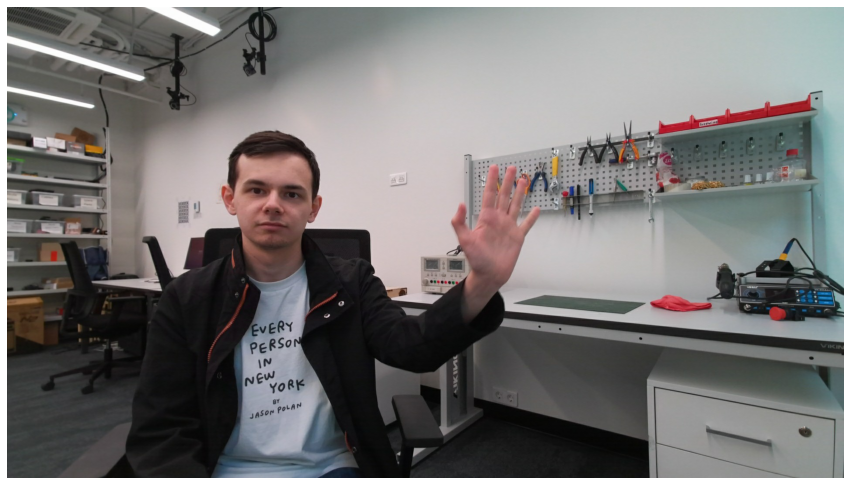

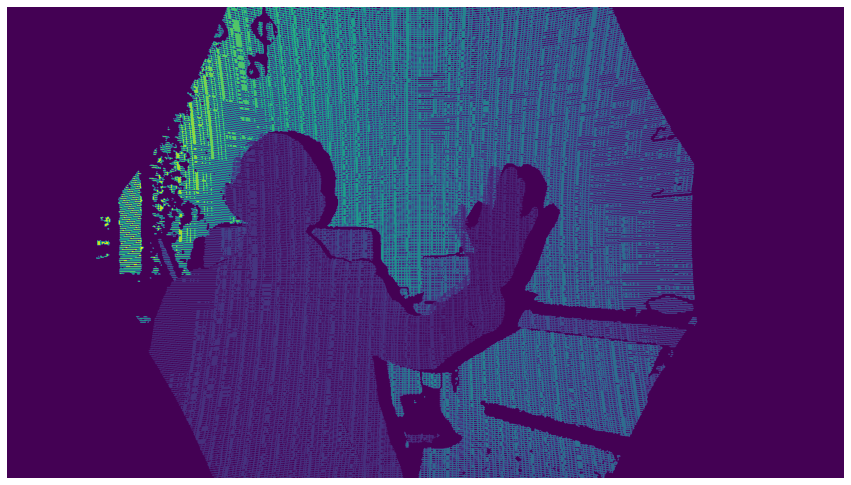

In [7]:
# Resolutions
print(f"Image resolution: {np.asarray(image).shape}")
print(f"Depth resolution: {np.asarray(depth).shape}")

# RGB image
plt.figure(figsize=(15, 30))
plt.imshow(image)
plt.axis("off")

# Depth image
plt.figure(figsize=(15, 30))
plt.imshow(depth)
plt.axis("off");

## Transform Depth image to Point cloud

Using the intrinsics of Depth transform Depth image to World frame

In [8]:
depth_intrinsic = o3d.camera.PinholeCameraIntrinsic(*depth_size[::-1],
                                                    *focal_length_depth,
                                                    *principal_point_depth)

depth_cloud = o3d.geometry.PointCloud.create_from_depth_image(depth,
                                                              depth_intrinsic,
                                                              depth_scale=1000.0,
                                                              depth_trunc=5000.0)

# Flip it, otherwise the pointcloud will be upside down
# depth_cloud.transform([[1, 0, 0, 0],
#                        [0, -1, 0, 0],
#                        [0, 0, -1, 0],
#                        [0, 0, 0, 1]])

#### Visualize Depth point cloud (OpenGL)

Export DISPLAY variable if connected via remote

In [17]:
os.environ['DISPLAY'] = os.environ['SSH_CLIENT'].split()[0] + ":0.0"

In [32]:
o3d.visualization.draw_geometries([depth_cloud])

#### Visualization using PlotLy (for remote)

In [14]:
import plotly.graph_objects as go

In [18]:
depth_points = np.asarray(depth_cloud.points)

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=depth_points[::100,0],
            y=depth_points[::100,1],
            z=depth_points[::100,2],
            mode='markers',
            marker=dict(size=1),
        )
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        )
    )
)
fig.show()

## Project Depth point cloud on RGB image

Project points coordinates

In [9]:
# Form array of depth points
depth_points = np.asarray(depth_cloud.points)
points_n = depth_points.shape[0]
depth_points = np.hstack([depth_points, np.ones((points_n, 1))])

# Project points on image
depth_projected = depth_points @ intrinsic_image.T
depth_projected = depth_projected / depth_points[:, 2].reshape(points_n, 1)
depth_projected = np.delete(depth_projected, 2, axis=1)
depth_projected[:, 2] = 1 / depth_projected[:, 2]
depth_projected[:, :2] = depth_projected[:, :2].round()

# Filter outer points
depth_index = ((0 <= depth_projected[:, 0]) *
               (depth_projected[:, 0] < image_size[1]) *
               (0 <= depth_projected[:, 1]) * 
               (depth_projected[:, 1] < image_size[0]))

depth_projected = depth_projected[depth_index]

Construct depth image on Colored image

In [10]:
# Create image
depth_on_image = np.full((image_size[0], image_size[1]), 0.)
depth_on_image[depth_projected[:, 1].astype(np.int16),
               depth_projected[:, 0].astype(np.int16)] = depth_projected[:, 2]

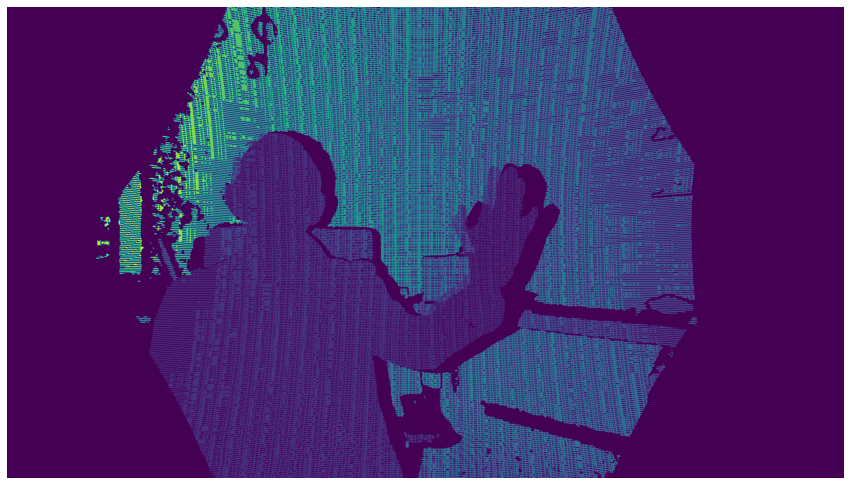

In [11]:
plt.figure(figsize=(15, 30))
plt.imshow(depth_on_image)
plt.axis("off");

## Create Colored Point Cloud

Create RGB-D image

In [12]:
# Convert Projected depth image to open3d object
depth_on_image = o3d.geometry.Image(depth_on_image.astype(np.float32))

rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(image,
                                                                depth_on_image,
                                                                depth_scale=1.0,
                                                                depth_trunc=1.1,
                                                                convert_rgb_to_intensity=False)

Create colored Point Cloud

In [13]:
image_intrinsic = o3d.camera.PinholeCameraIntrinsic(*image_size[::-1],
                                                    *focal_length_image,
                                                    *principal_point_image)

colored_pc = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_image,
                                                            image_intrinsic)

#### Visualize Colored point cloud (OpenGL)

Export DISPLAY variable if connected via remote

In [103]:
os.environ['DISPLAY'] = os.environ['SSH_CLIENT'].split()[0] + ":0.0"

In [ ]:
o3d.visualization.draw_geometries([colored_pc])

#### Visualization using PlotLy (for remote)

In [16]:
import plotly.graph_objects as go

In [19]:
colored_points = np.asarray(colored_pc.points)
colored_colors = np.asarray(colored_pc.colors)

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=colored_points[::10,0],
            y=colored_points[::10,1],
            z=colored_points[::10,2],
            mode='markers',
            marker=dict(size=1, color=colored_colors[::10])
        )
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        )
    )
)
fig.show()